<a href="https://colab.research.google.com/github/LuciferX45/Bird-Species-Classification/blob/main/Birds_Classification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Bird Species Classification**

## **Importing Libraries**

In [1]:
import numpy as np
import cv2 as cv
import matplotlib.pyplot as plt
import os

import tensorflow as tf
from tensorflow import keras
from keras import layers
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.preprocessing import image

%matplotlib inline

## **Importing Dataset**

In [2]:
from google.colab import files
files.upload()

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"gautamp45","key":"200ca7415b16899a3eaf998c9c97687a"}'}

In [3]:
!ls -lha kaggle.json

-rw-r--r-- 1 root root 65 May 27 17:53 kaggle.json


In [4]:
!pip install -q kaggle

In [5]:
!mkdir -p ~/.kaggle #Create the directory

In [6]:
!cp kaggle.json ~/.kaggle/

In [7]:
!chmod 600 /root/.kaggle/kaggle.json

In [8]:
!pwd

/content


In [9]:
!kaggle datasets download -d gpiosenka/100-bird-species

100% 1.95G/1.96G [00:54<00:00, 39.2MB/s]
100% 1.96G/1.96G [00:54<00:00, 38.7MB/s]


In [10]:
!unzip 100-bird-species.zip

Streaming output truncated to the last 5000 lines.
  inflating: train/WHITE TAILED TROPIC/120.jpg  
  inflating: train/WHITE TAILED TROPIC/121.jpg  
  inflating: train/WHITE TAILED TROPIC/122.jpg  
  inflating: train/WHITE TAILED TROPIC/123.jpg  
  inflating: train/WHITE TAILED TROPIC/124.jpg  
  inflating: train/WHITE TAILED TROPIC/125.jpg  
  inflating: train/WHITE TAILED TROPIC/126.jpg  
  inflating: train/WHITE TAILED TROPIC/127.jpg  
  inflating: train/WHITE TAILED TROPIC/128.jpg  
  inflating: train/WHITE TAILED TROPIC/129.jpg  
  inflating: train/WHITE TAILED TROPIC/130.jpg  
  inflating: train/WHITE TAILED TROPIC/131.jpg  
  inflating: train/WHITE TAILED TROPIC/132.jpg  
  inflating: train/WHITE TAILED TROPIC/133.jpg  
  inflating: train/WHITE TAILED TROPIC/134.jpg  
  inflating: train/WHITE TAILED TROPIC/135.jpg  
  inflating: train/WHITE TAILED TROPIC/136.jpg  
  inflating: train/WHITE TAILED TROPIC/137.jpg  
  inflating: train/WHITE TAILED TROPIC/138.jpg  
  inflating: train

## **Data Preprocessing**

In [11]:
train_dir ="/content/train"
val_dir="/content/valid"

In [12]:
train_datagen = ImageDataGenerator(
    rescale=1./255
)

train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size = (224,224),
    batch_size= 32,
    color_mode='rgb',
    class_mode = 'categorical'
)


valid_datager =ImageDataGenerator(
    rescale=1./255
)

valid_generator = train_datagen.flow_from_directory(
    val_dir,
    target_size = (224,224),
    batch_size= 32,
    color_mode='rgb',
    class_mode = 'categorical'
)

Found 84635 images belonging to 525 classes.
Found 2625 images belonging to 525 classes.


In [13]:
def show_images(gen):
    g_dict = gen.class_indices
    classes = list(g_dict.keys())
    images, labels = next(gen)
    plt.figure(figsize= (20, 20))
    length = len(labels)
    sample = min(length, 25)
    for i in range(sample):
        plt.subplot(5, 5, i + 1)
        image = images[i] 
        plt.imshow(image)
        index = np.argmax(labels[i])
        class_name = classes[index]
        plt.title(class_name, color= 'blue', fontsize= 12)
        plt.axis('off')
    plt.show()

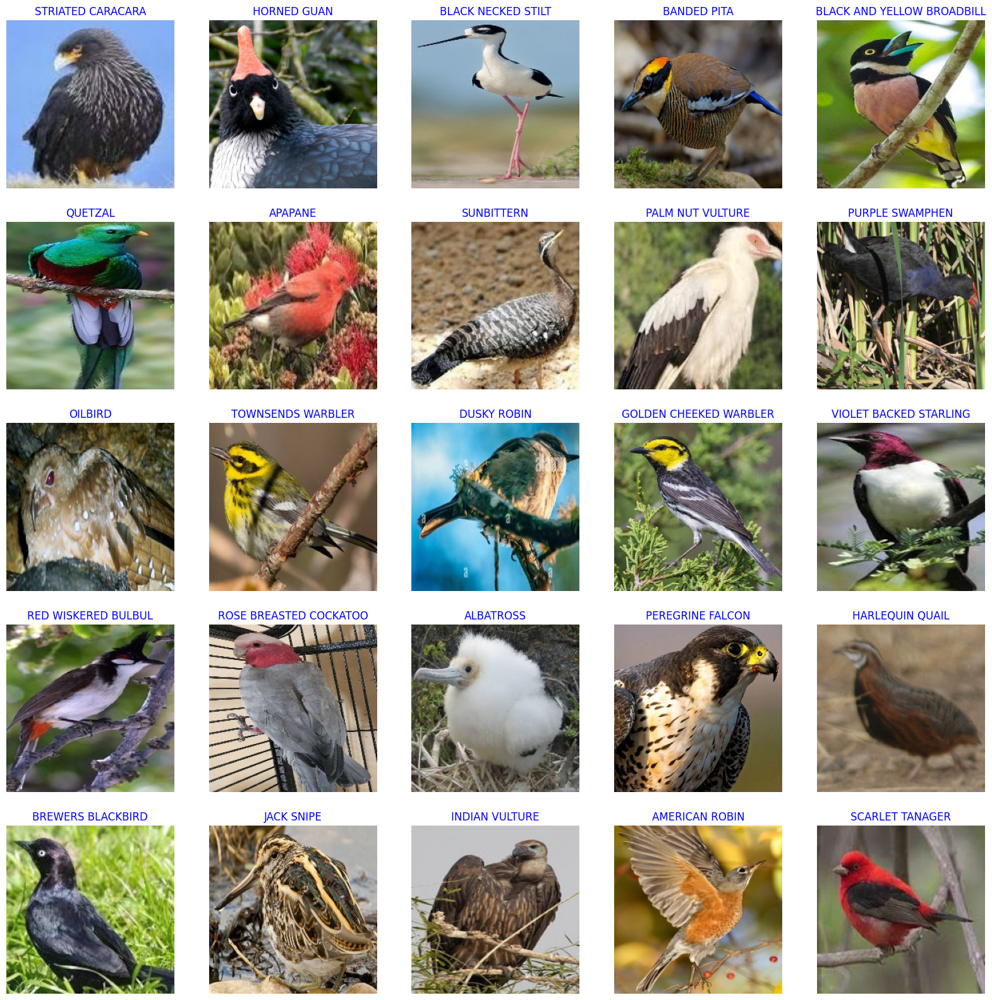

In [14]:
show_images(train_generator)

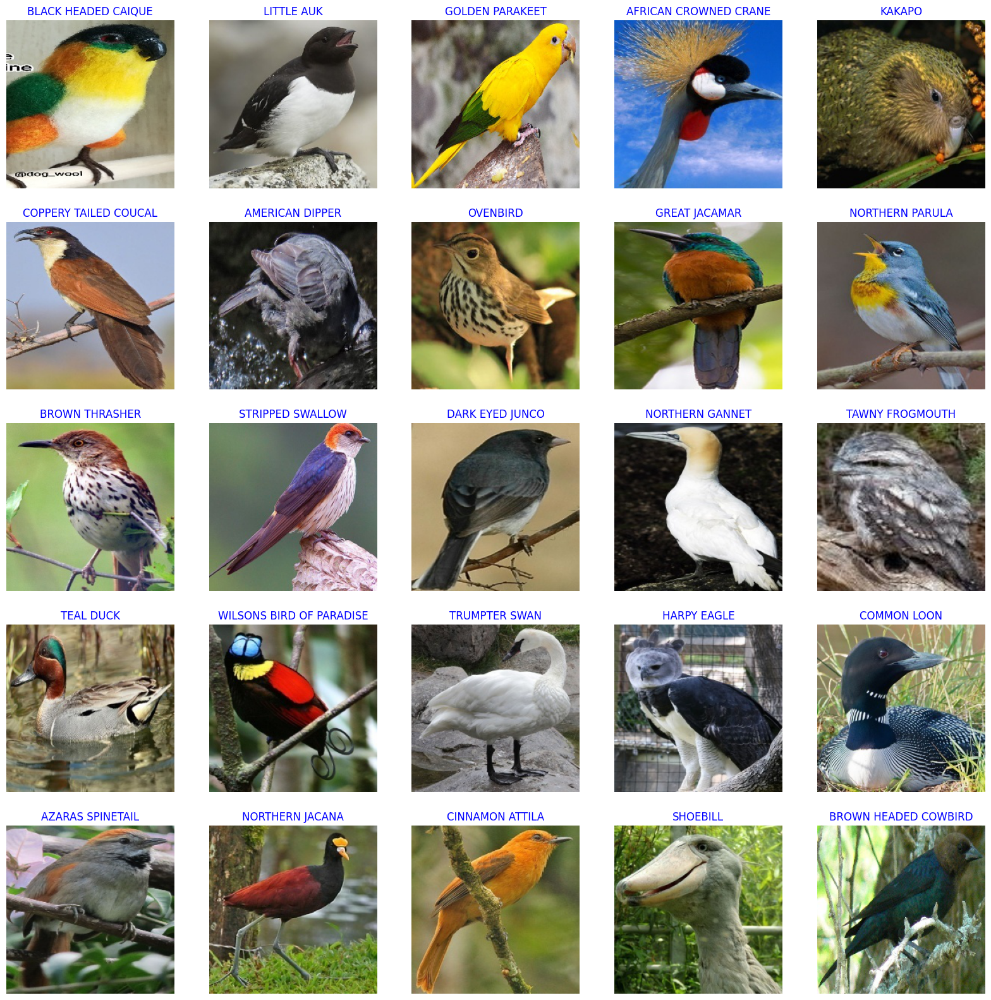

In [15]:
show_images(valid_generator)

## **Model Building**

In [16]:
input_shape = keras.Input(shape=(224,224,3))
base_model = tf.keras.applications.resnet.ResNet101(
    include_top=False,
    weights='imagenet',
#     input_tensor=None,
#     input_shape=None,
#     pooling=None,
#     classes=1000,
    input_tensor = input_shape
)

171446536/171446536 [==============================] - 6s 0us/step


In [17]:
summary = base_model.summary()

Model: "resnet101"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 230, 230, 3)  0           ['input_1[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 112, 112, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                                                          

In [18]:
base_model.trainable = False

In [19]:
for layer in base_model.layers:
    layer.trainable = False

for layer in base_model.layers[:12]:
    layer.trainable = True

In [20]:
for i,layer in enumerate(base_model.layers):
    print(i,layer.name,"-",layer.trainable)

0 input_1 - True
1 conv1_pad - True
2 conv1_conv - True
3 conv1_bn - True
4 conv1_relu - True
5 pool1_pad - True
6 pool1_pool - True
7 conv2_block1_1_conv - True
8 conv2_block1_1_bn - True
9 conv2_block1_1_relu - True
10 conv2_block1_2_conv - True
11 conv2_block1_2_bn - True
12 conv2_block1_2_relu - False
13 conv2_block1_0_conv - False
14 conv2_block1_3_conv - False
15 conv2_block1_0_bn - False
16 conv2_block1_3_bn - False
17 conv2_block1_add - False
18 conv2_block1_out - False
19 conv2_block2_1_conv - False
20 conv2_block2_1_bn - False
21 conv2_block2_1_relu - False
22 conv2_block2_2_conv - False
23 conv2_block2_2_bn - False
24 conv2_block2_2_relu - False
25 conv2_block2_3_conv - False
26 conv2_block2_3_bn - False
27 conv2_block2_add - False
28 conv2_block2_out - False
29 conv2_block3_1_conv - False
30 conv2_block3_1_bn - False
31 conv2_block3_1_relu - False
32 conv2_block3_2_conv - False
33 conv2_block3_2_bn - False
34 conv2_block3_2_relu - False
35 conv2_block3_3_conv - False
36 con

In [21]:
model = keras.models.Sequential()
model.add(base_model)
model.add(layers.Flatten())
model.add(layers.Dense(1024,activation='relu'))
model.add(layers.Dense(512,activation='relu'))
model.add(layers.Dense(525,activation='softmax'))

In [22]:
model.compile(optimizer = keras.optimizers.RMSprop(learning_rate=2e-5),
              metrics=['accuracy'],
              loss='categorical_crossentropy')

In [23]:
class myCallBack (keras.callbacks.Callback):
    def on_epoch_end(self,epoch,logs={}):
        if(logs.get('accuracy')>0.97):
            print("Stopping Training!")
            self.model.stop_training = True
            
callbacks = myCallBack()

In [24]:
history = model.fit(train_generator, epochs=100,
validation_data = valid_generator,verbose=1,callbacks=[callbacks])

Epoch 1/100
2645/2645 [==============================] - 543s 199ms/step - loss: 2.3733 - accuracy: 0.5373 - val_loss: 0.7954 - val_accuracy: 0.8019
Epoch 2/100
2645/2645 [==============================] - 519s 196ms/step - loss: 0.2726 - accuracy: 0.9302 - val_loss: 0.7007 - val_accuracy: 0.8331
Epoch 3/100
2645/2645 [==============================] - 526s 199ms/step - loss: 0.0549 - accuracy: 0.9851 - val_loss: 0.6709 - val_accuracy: 0.8461


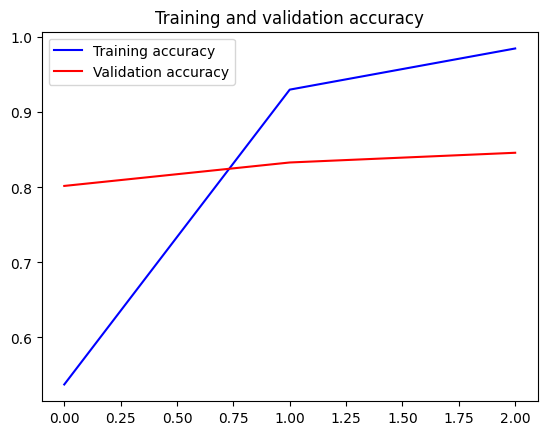

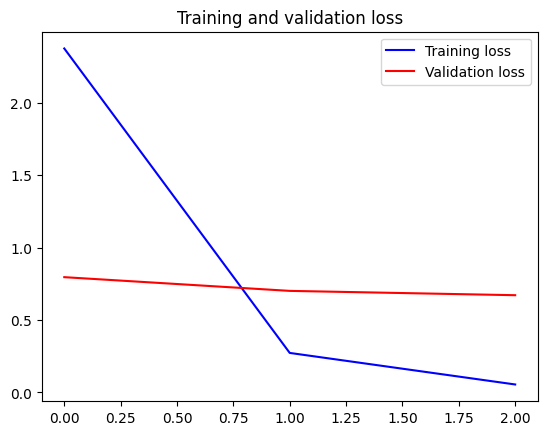

In [25]:
accuracy = history.history['accuracy']
val_accuracy = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(accuracy))
plt.plot(epochs, accuracy, 'b', label='Training accuracy')
plt.plot(epochs, val_accuracy, 'r', label='Validation accuracy')

plt.title('Training and validation accuracy')
plt.legend()
plt.figure()
plt.plot(epochs, loss, 'b', label='Training loss')
plt.plot(epochs, val_loss, 'r', label='Validation loss')

plt.title('Training and validation loss')
plt.legend()
plt.show()

## **Model Testing**

In [26]:
# Define a dictionary to convert label indices to class names
class_names = train_generator.class_indices
class_names = {v: k for k, v in class_names.items()}

# Use the trained model to predict labels for the test images
test_dir = "/content/test"
test_datagen = ImageDataGenerator(
    rescale=1./255
)

test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size = (224,224),
    batch_size= 32,
    color_mode='rgb',
    class_mode = 'categorical',
    shuffle=False
)

predictions = model.predict(test_generator)

# Convert the predicted probabilities to class labels
predicted_labels = np.argmax(predictions, axis=1)
predicted_labels = [class_names[label] for label in predicted_labels]

# Get the true labels of the test images
true_labels = test_generator.classes
true_labels = [class_names[label] for label in true_labels]

Found 2625 images belonging to 525 classes.
83/83 [==============================] - 16s 171ms/step


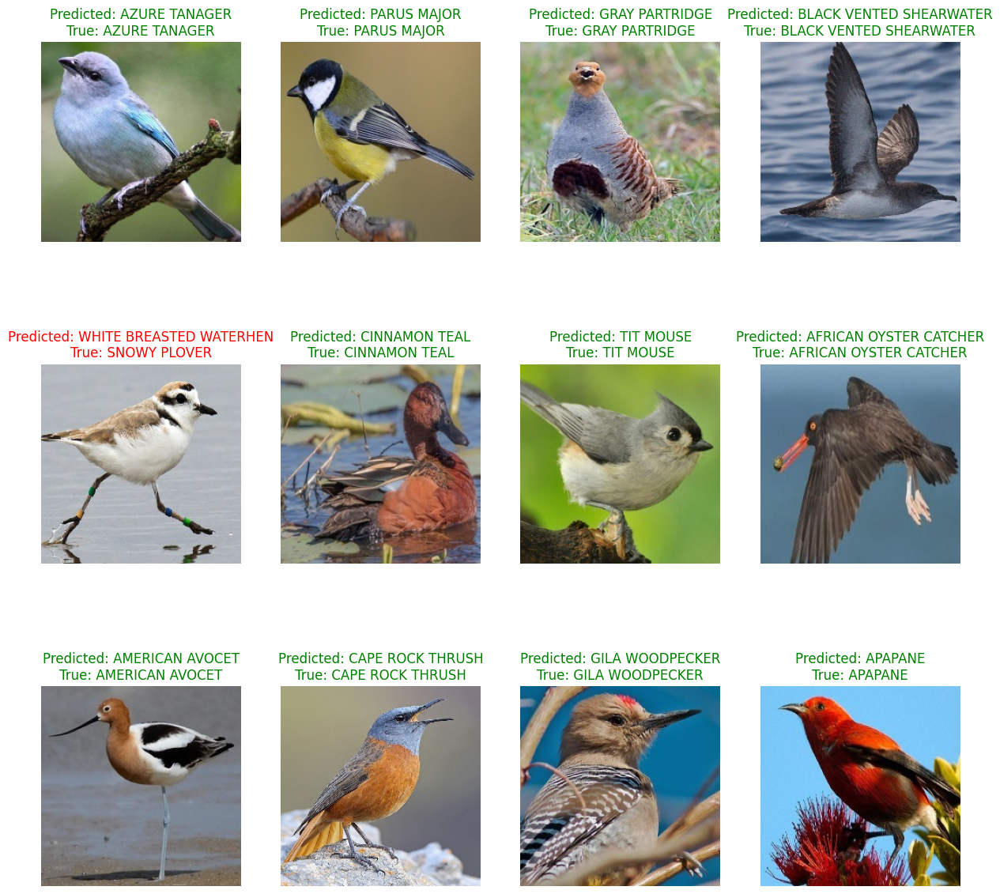

In [27]:
# Print the predicted and true labels for a subset of test images
n_rows = 3
n_cols = 4
fig, axs = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(15, 15))

np.random.seed(42)
random_indexes = np.random.choice(len(predicted_labels), size=n_rows*n_cols, replace=False)
for i, index in enumerate(random_indexes):
    img_path = test_generator.filepaths[index]
    img = image.load_img(img_path, target_size=(224,224))
    axs[i//n_cols, i%n_cols].imshow(img)
    axs[i//n_cols, i%n_cols].axis('off')
    axs[i//n_cols, i%n_cols].set_title("Predicted: {}\nTrue: {}".format(predicted_labels[index], true_labels[index]), 
                      color='green' if predicted_labels[index] == true_labels[index] else 'red')
plt.show()

## **Model Evaluation**

In [31]:
from sklearn.metrics import accuracy_score

# Convert the predicted probabilities to class labels
predicted_labels = np.argmax(predictions, axis=1)
predicted_labels = [class_names[label] for label in predicted_labels]

# Get the true labels of the test images
true_labels = test_generator.classes
true_labels = [class_names[label] for label in true_labels]

# Calculate accuracy score
accuracy = accuracy_score(true_labels, predicted_labels)

# Print the accuracy
print("Accuracy on test data:", accuracy)

Accuracy on test data: 0.8731428571428571


In [32]:
from sklearn.metrics import classification_report

# Calculate precision, recall, and F1-score
classification_rep = classification_report(true_labels, predicted_labels)

# Print the classification report
print(classification_rep)


                               precision    recall  f1-score   support

              ABBOTTS BABBLER       1.00      0.60      0.75         5
                ABBOTTS BOOBY       1.00      0.40      0.57         5
   ABYSSINIAN GROUND HORNBILL       1.00      1.00      1.00         5
        AFRICAN CROWNED CRANE       1.00      1.00      1.00         5
       AFRICAN EMERALD CUCKOO       1.00      0.80      0.89         5
            AFRICAN FIREFINCH       0.67      0.80      0.73         5
       AFRICAN OYSTER CATCHER       1.00      1.00      1.00         5
        AFRICAN PIED HORNBILL       1.00      1.00      1.00         5
          AFRICAN PYGMY GOOSE       1.00      1.00      1.00         5
                    ALBATROSS       0.62      1.00      0.77         5
               ALBERTS TOWHEE       0.80      0.80      0.80         5
         ALEXANDRINE PARAKEET       1.00      0.80      0.89         5
                ALPINE CHOUGH       0.60      0.60      0.60         5
     